In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from IPython.display import display

In [2]:
# --------------------------------------------------------------
# Load data
# --------------------------------------------------------------
df = pd.read_pickle("../../data/interim/01_data_processed.pkl")

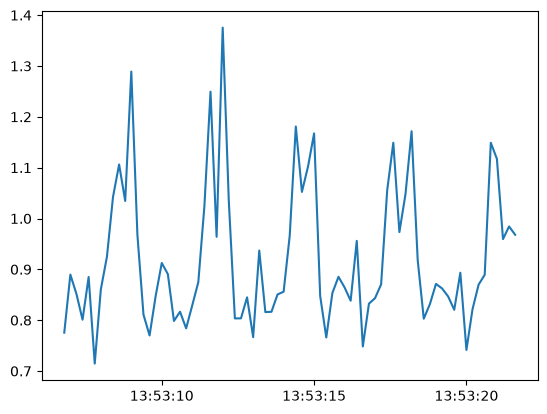

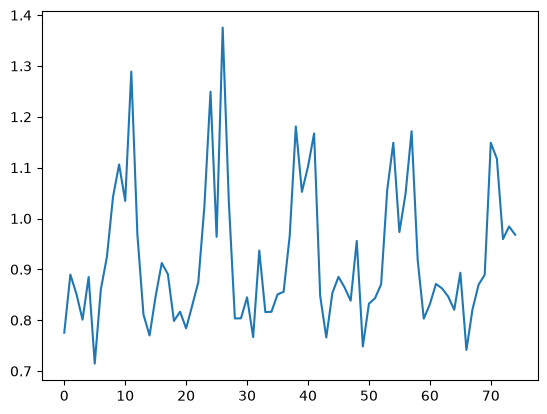

In [3]:
# --------------------------------------------------------------
# Plot single columns
# --------------------------------------------------------------

set_df = df[df['set'] == 1]
plt.plot(set_df["acc_y"])
plt.show()

plt.plot(set_df["acc_y"].reset_index(drop=True))
# The reset index is sometime convenint because it replaces the time stamp in index and usse number temperory, so we can see the count in 
# the chart show below
plt.show()


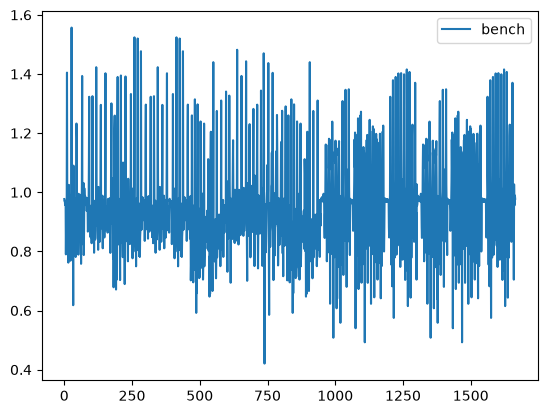

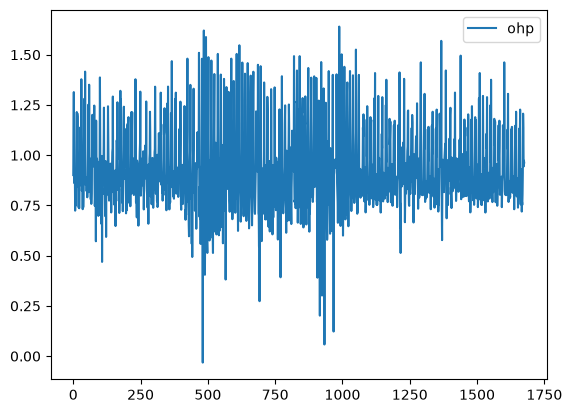

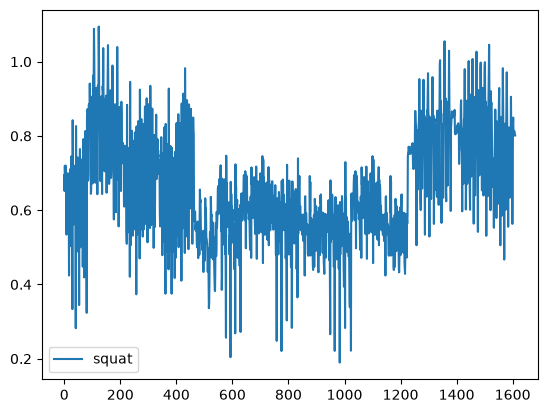

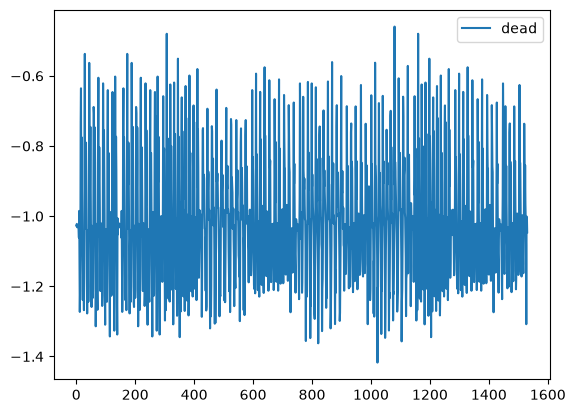

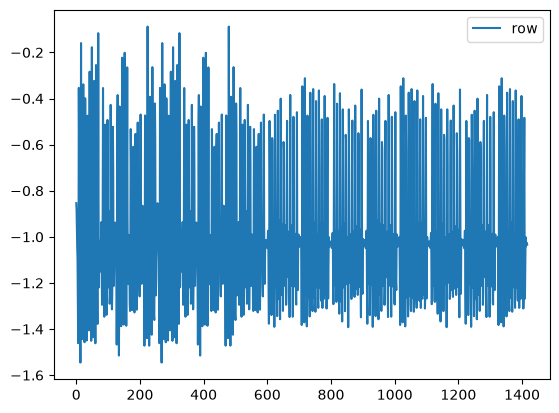

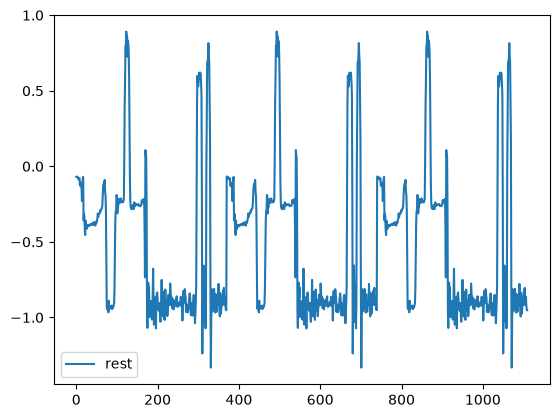

In [4]:
# --------------------------------------------------------------
# Plot all exercises
# --------------------------------------------------------------

for label in df["label"].unique():
    subset = df[df["label"] == label]
    fig, ax = plt.subplots()
    plt.plot(subset["acc_y"].reset_index(drop=True), label= label)
    plt.legend()
    plt.show()

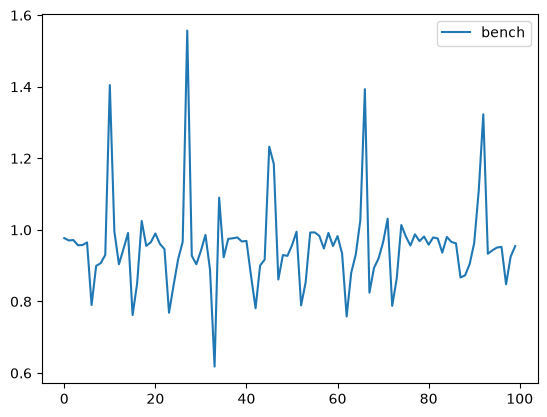

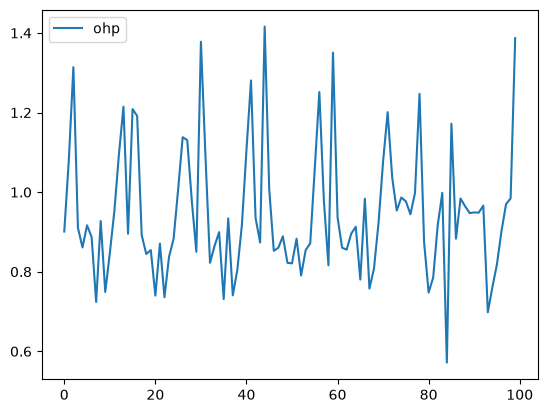

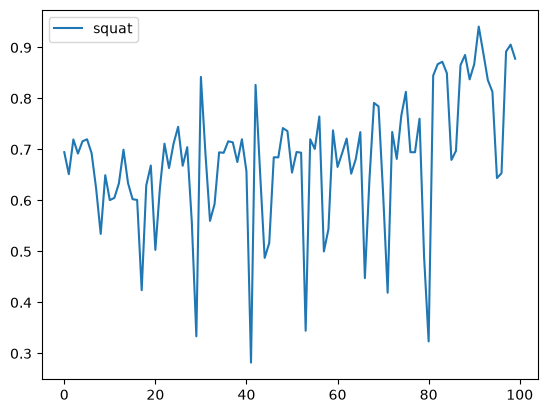

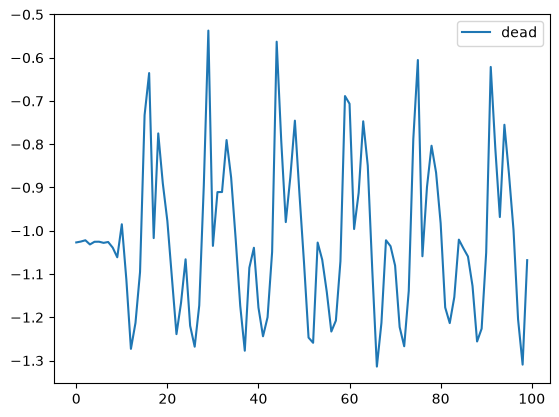

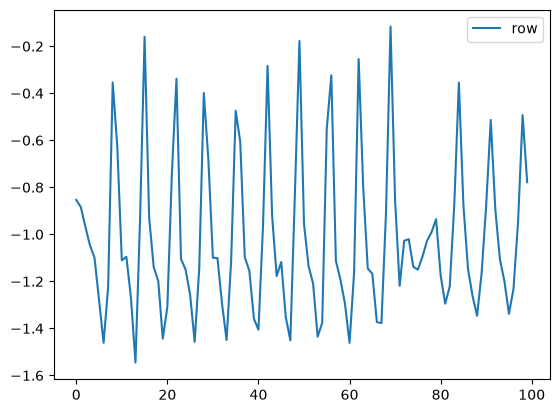

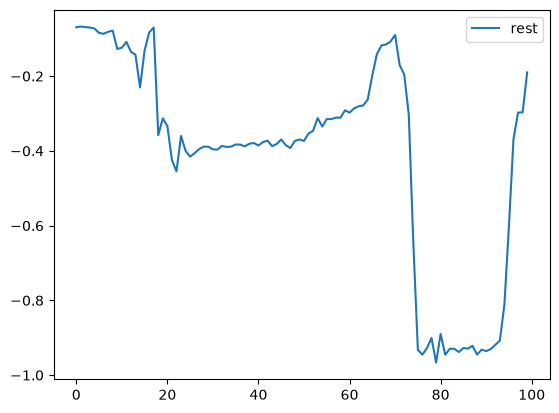

In [5]:
#another set of data only for 100 records rather than all data

for label in df["label"].unique():
    subset = df[df["label"] == label]
    fig, ax = plt.subplots()
    plt.plot(subset[:100]["acc_y"].reset_index(drop=True), label= label)
    plt.legend()
    plt.show()

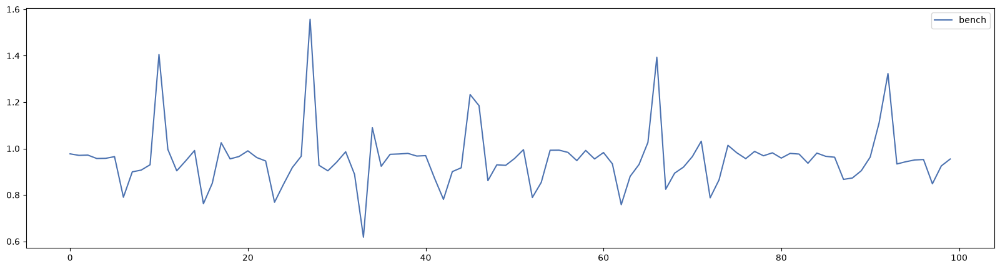

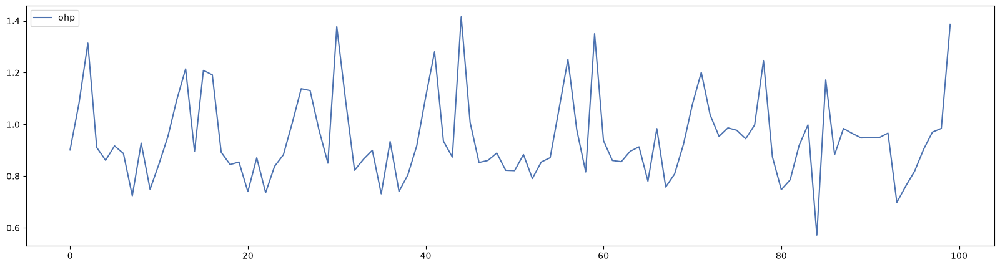

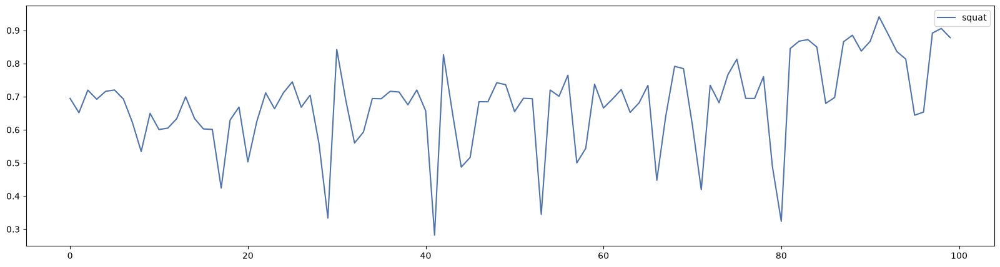

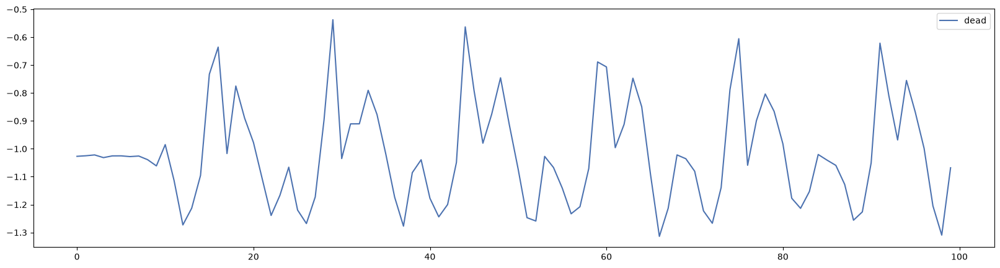

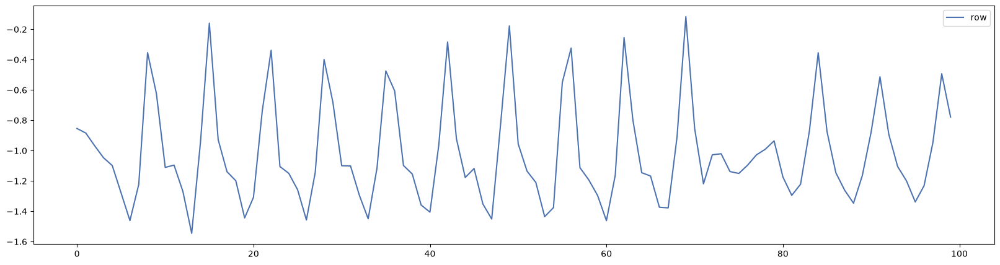

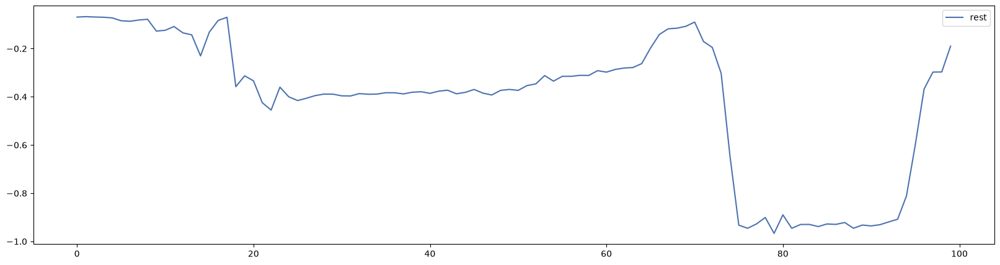

In [6]:
# --------------------------------------------------------------
# Adjust plot settings ( using the rcPram)
# --------------------------------------------------------------

mpl.style.use("seaborn-v0_8-deep")
mpl.rcParams["figure.figsize"] = (20,5)
mpl.rcParams["figure.dpi"] = 100

for label in df["label"].unique():
    subset = df[df["label"] == label]
    fig, ax = plt.subplots()
    plt.plot(subset[:100]["acc_y"].reset_index(drop=True), label= label)
    plt.legend()
    plt.show()

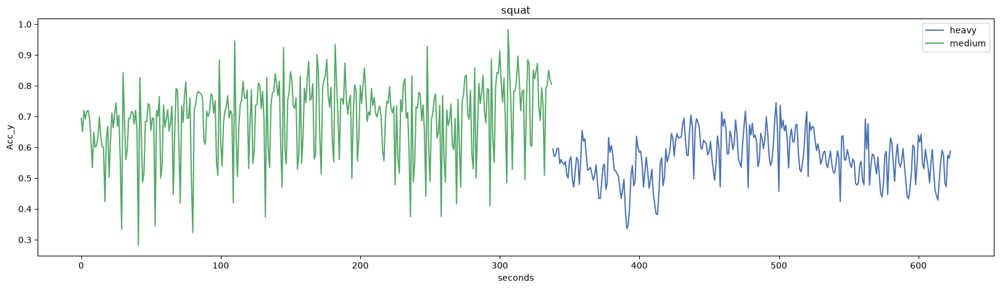

In [7]:
# --------------------------------------------------------------
# Compare medium vs. heavy sets
# --------------------------------------------------------------

category_df = df.query("label == 'squat'").query("participants == 'A'").reset_index()

fig, ax = plt.subplots()
category_df.groupby(["Category"])["acc_y"].plot() #this will create sepration between medium and heavy weights
ax.set_ylabel( "Acc_y" )
ax.set_xlabel ("seconds")
plt.title("squat")
plt.legend()
plt.show()

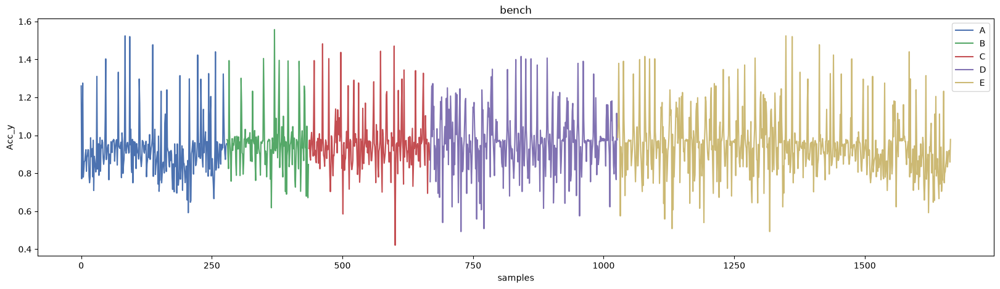

In [16]:
# --------------------------------------------------------------
# Compare participants
# --------------------------------------------------------------

# we are sorting data on basese of participants to category person wise
participants_df = df.query("label == 'bench'").sort_values("participants").reset_index()

fig, ax = plt.subplots()
participants_df.groupby(["participants"])["acc_y"].plot() #this will create sepration between medium and heavy weights
ax.set_ylabel( "Acc_y" )
ax.set_xlabel ("samples")
plt.title("bench")
plt.legend()
plt.show()

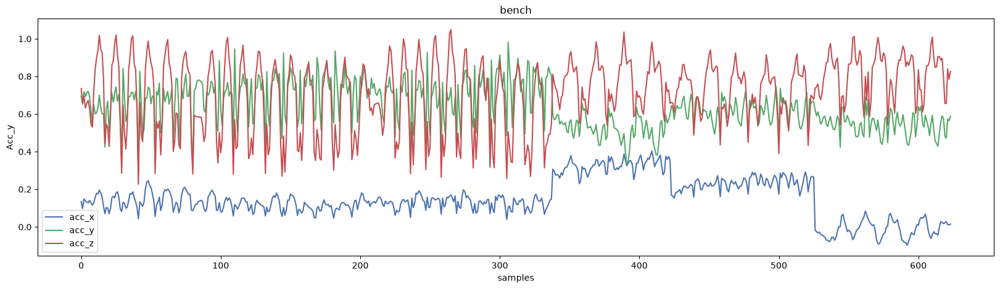

In [20]:
# --------------------------------------------------------------
# Plot multiple axis
# --------------------------------------------------------------

label = "squat"
participants = "A"
all_axis_df = df.query(f"label == '{label}'").query(f"participants == '{participants}'").reset_index()


fig, ax = plt.subplots()
all_axis_df[["acc_x","acc_y","acc_z"]].plot(ax=ax)
ax.set_ylabel( "Acc_y" )
ax.set_xlabel ("samples")
plt.title("bench")
plt.legend()
plt.show()


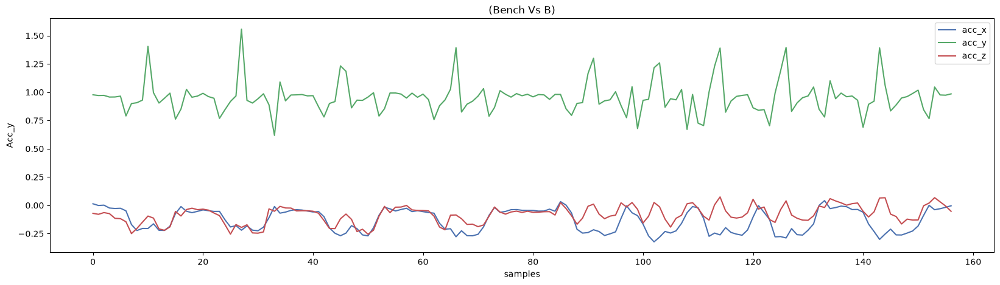

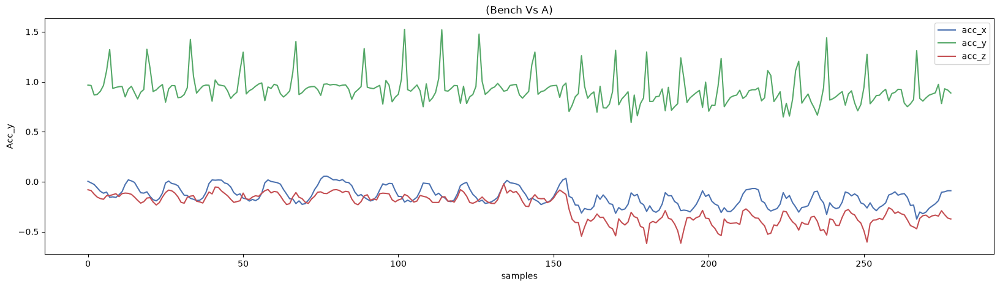

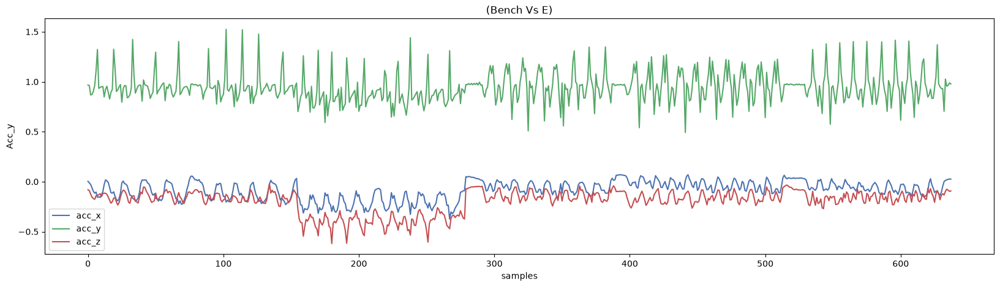

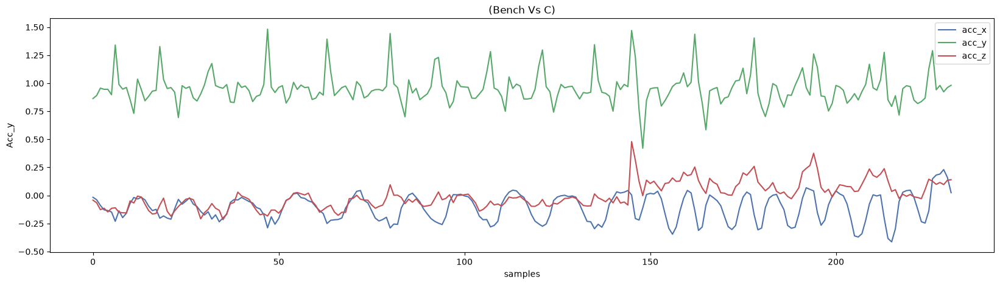

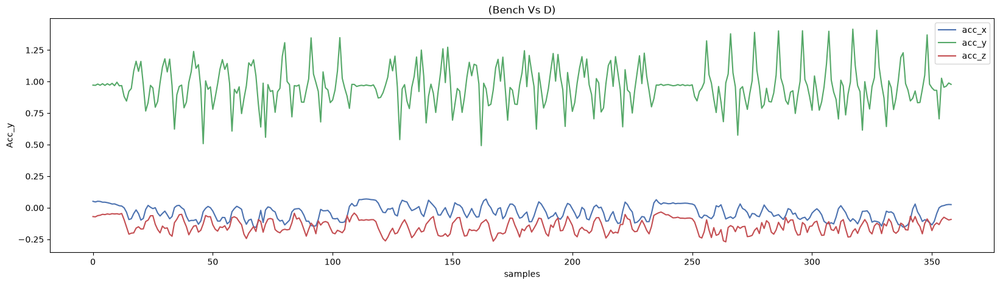

...

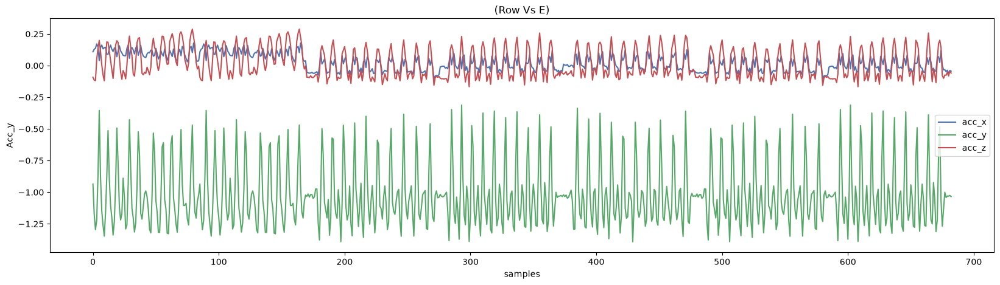

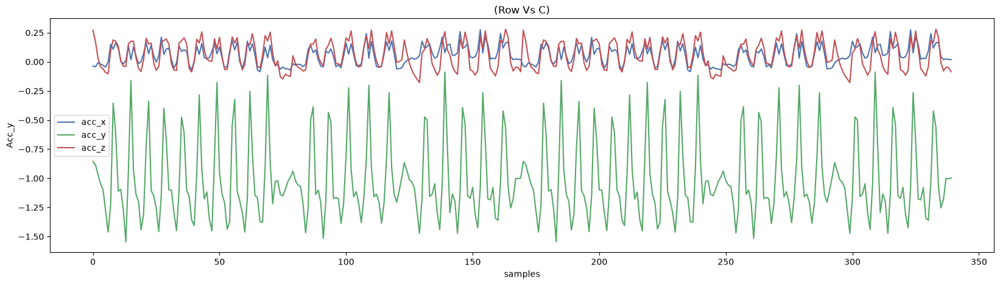

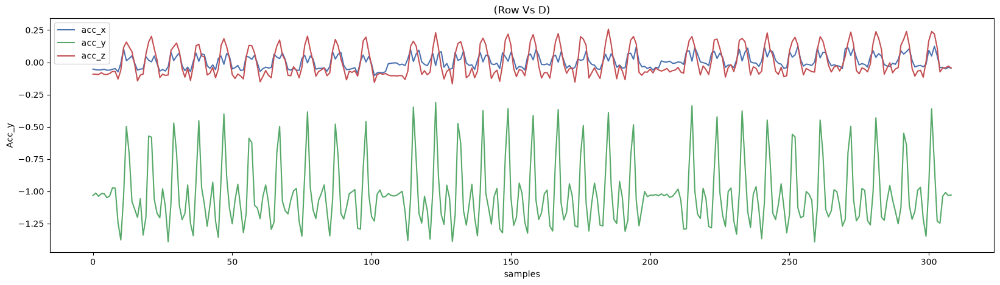

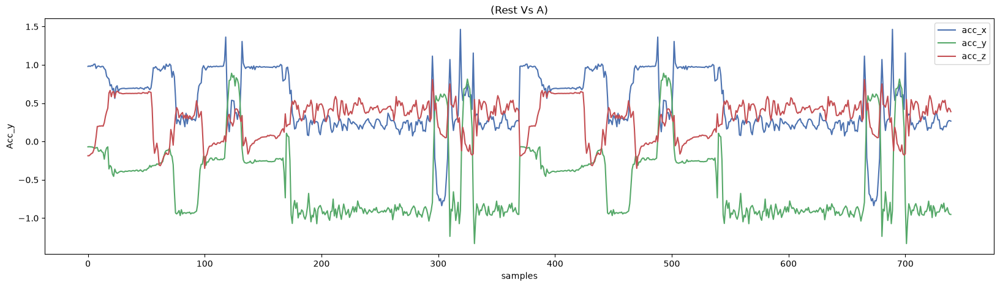

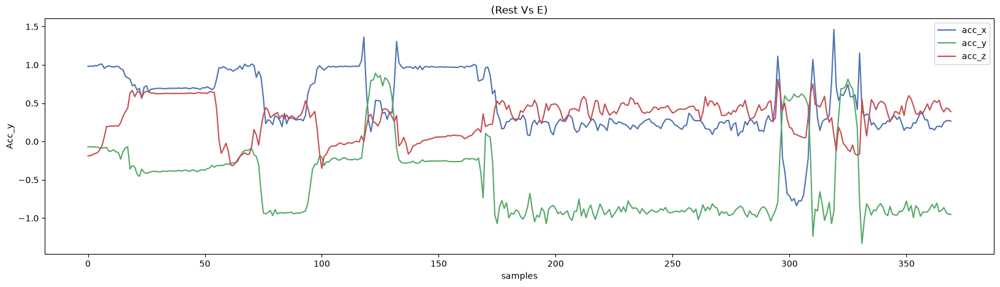

In [22]:
# --------------------------------------------------------------
# Create a loop to plot all combinations per sensor
# --------------------------------------------------------------

labels = df["label"].unique()
participants = df["participants"].unique()

# for displaying the acceleration data
for label in labels:
    for participant in participants:
        all_axis_df = (
                        df.query(f"label == '{label}'")
                        .query(f"participants == '{participant}'")
                        .reset_index()
         )
        
        if len(all_axis_df) > 0:
            fig, ax = plt.subplots()
            all_axis_df[["acc_x","acc_y","acc_z"]].plot(ax = ax)
            ax.set_ylabel( "Acc_y" )
            ax.set_xlabel ("samples")
            plt.title(f"({label} vs {participant})".title())
            plt.legend()
            plt.show()
  

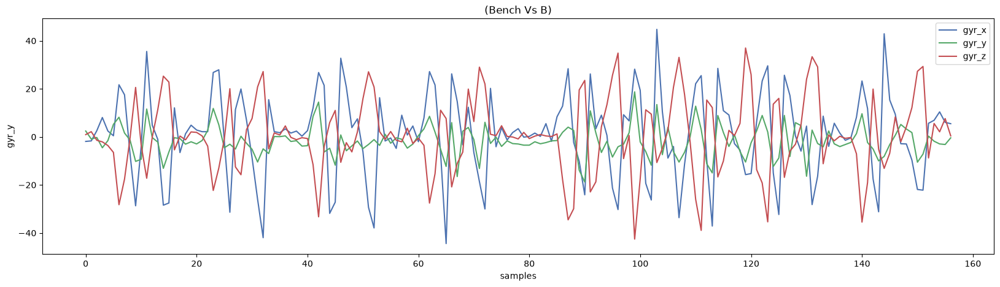

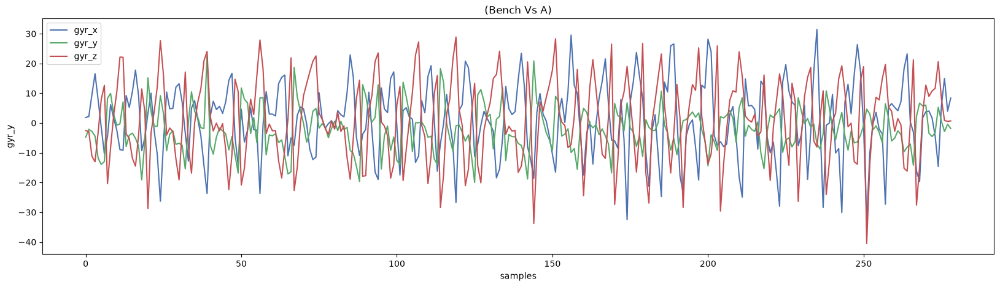

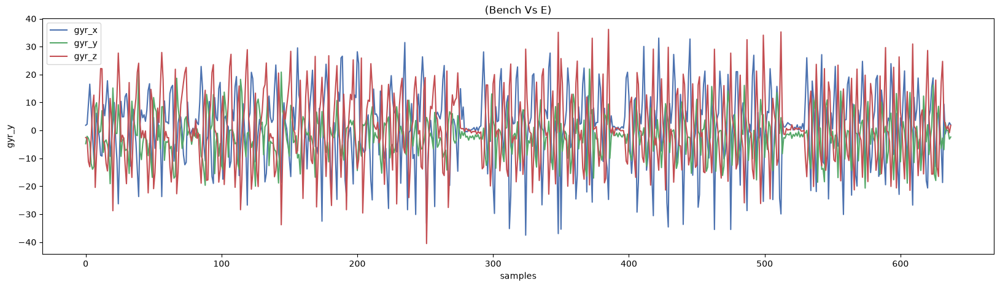

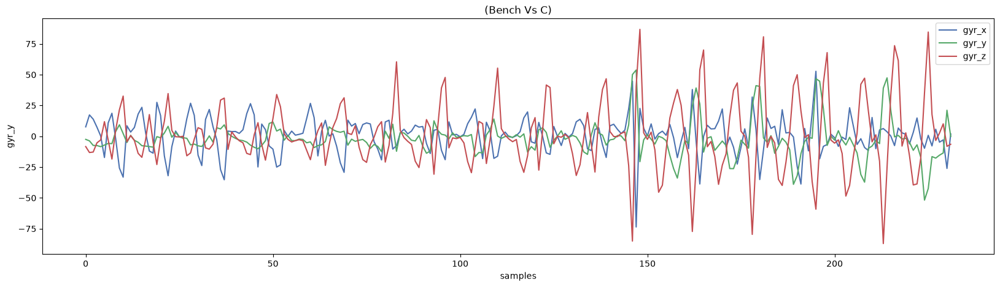

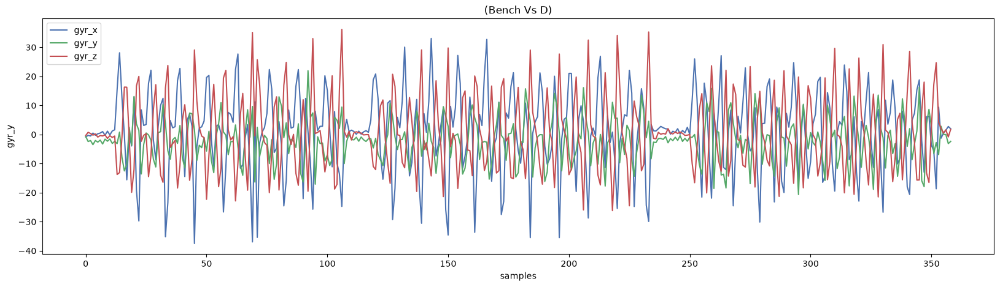

...

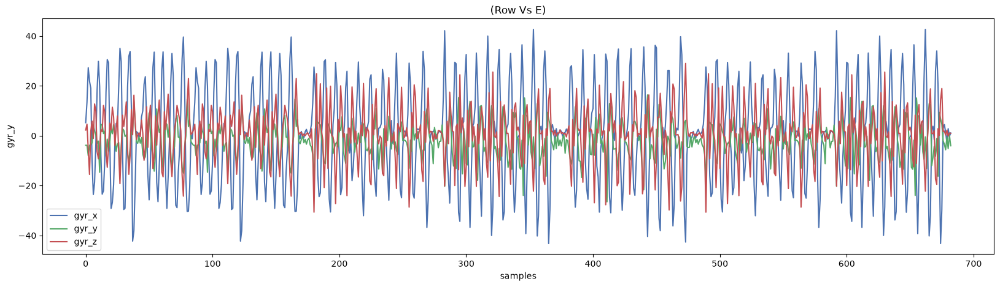

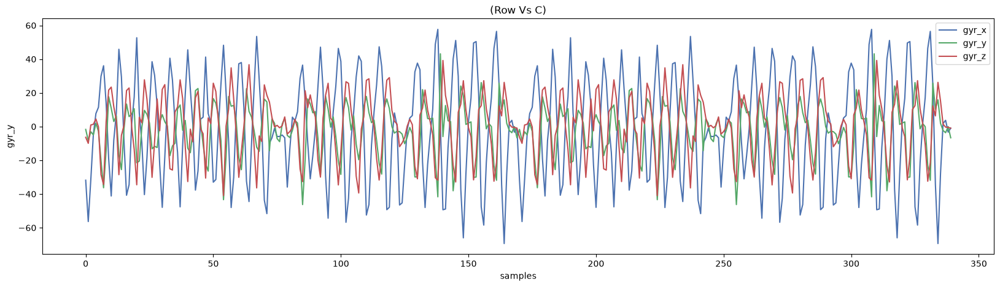

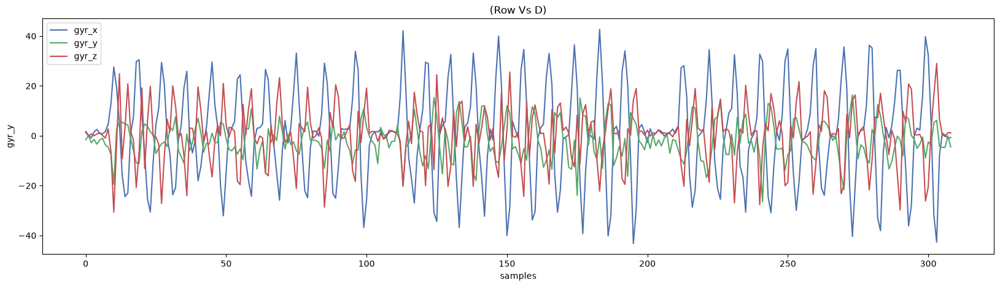

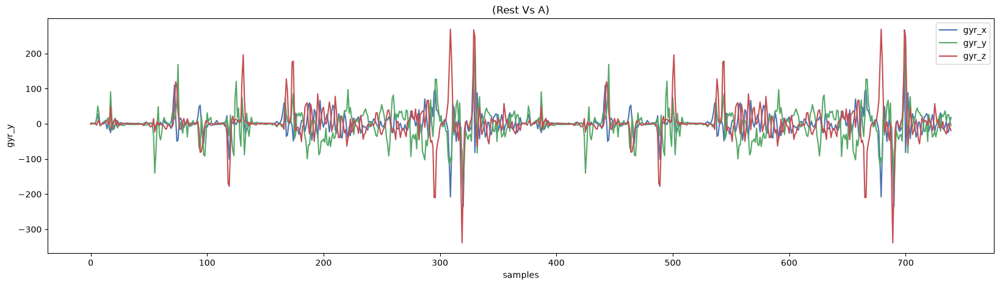

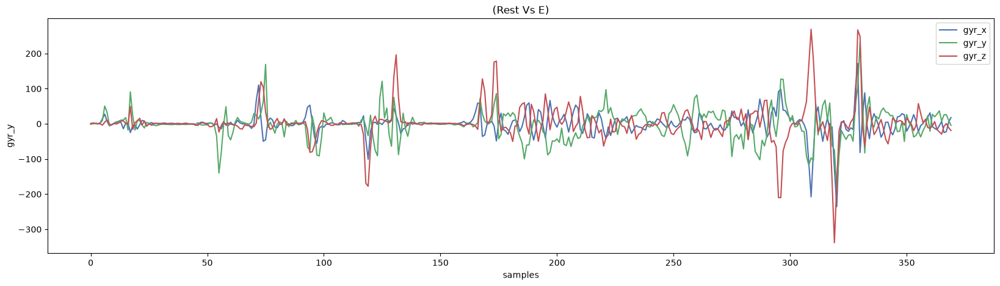

In [23]:
# for displaying the gyroscope data
for label in labels:
    for participant in participants:
        all_axis_df = (
                        df.query(f"label == '{label}'")
                        .query(f"participants == '{participant}'")
                        .reset_index()
         )
        # for displaying the acceleration data
        if len(all_axis_df) > 0:
            fig, ax = plt.subplots()
            all_axis_df[["gyr_x","gyr_y","gyr_z"]].plot(ax = ax)
            ax.set_ylabel( "gyr_y" )
            ax.set_xlabel ("samples")
            plt.title(f"({label} vs {participant})".title())
            plt.legend()
            plt.show()

Text(0.5, 0, 'samples')

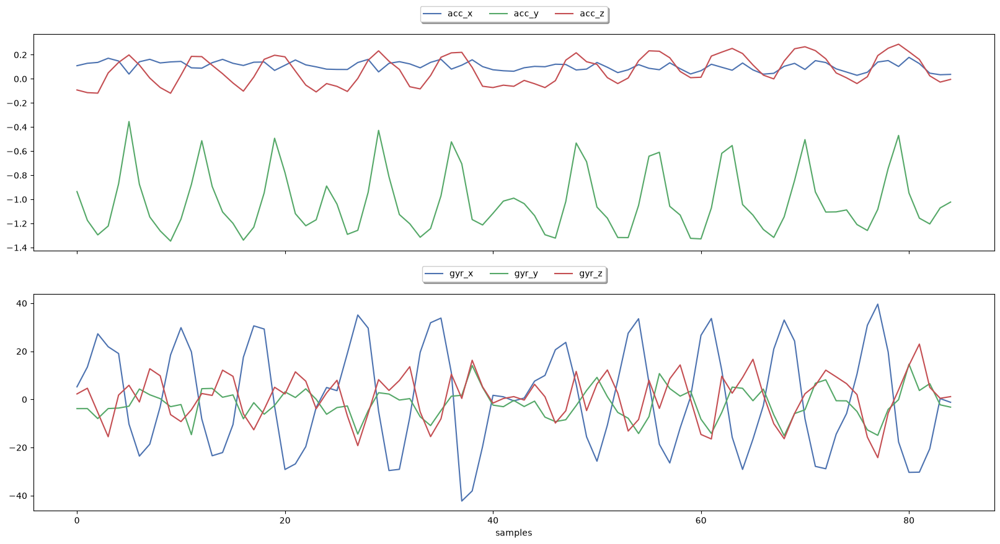

In [30]:
# --------------------------------------------------------------
# Combine plots in one figure
# --------------------------------------------------------------

label = "row"
participant = "A"
combined_axis_df = (
    df.query(f"label == '{label}'")
    .query(f"participants == '{participant}'")
    .reset_index(drop=True)
)

fig, ax = plt.subplots(nrows=2,sharex=True, figsize=(20,10))
combined_axis_df[["acc_x","acc_y","acc_z"]].plot(ax = ax[0])
combined_axis_df[["gyr_x","gyr_y","gyr_z"]].plot(ax = ax[1])

#Adding some styling for graph
ax[0].legend(loc="upper center", bbox_to_anchor =(0.5, 1.15), ncol=3, fancybox=True, shadow=True) #adding ledgend
ax[1].legend(loc="upper center", bbox_to_anchor =(0.5, 1.15), ncol=3, fancybox=True, shadow=True)
ax[1].set_xlabel("samples")


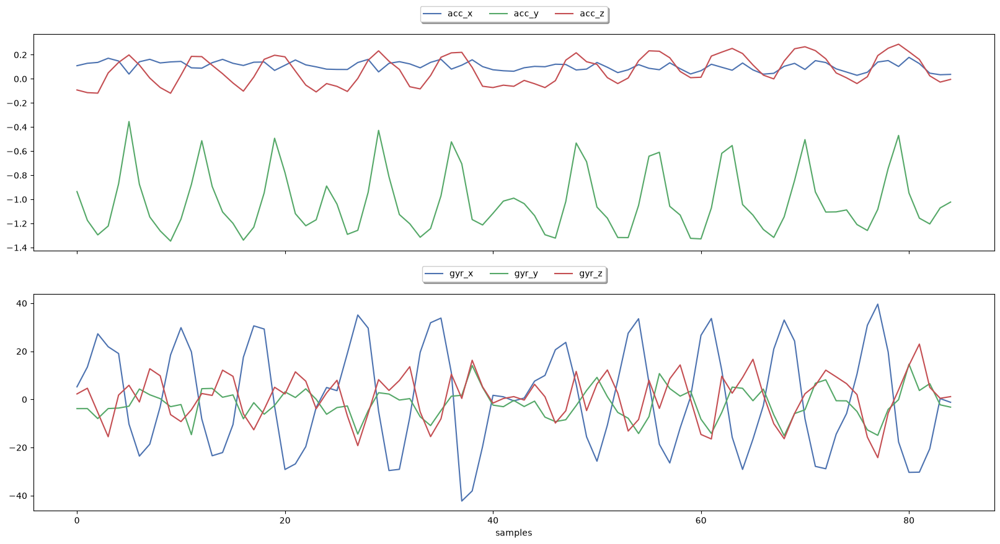

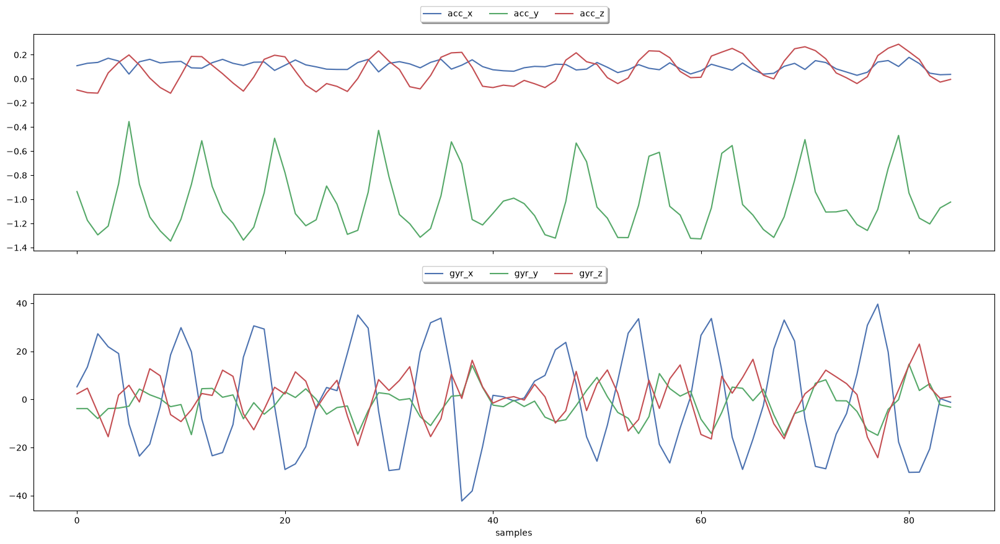

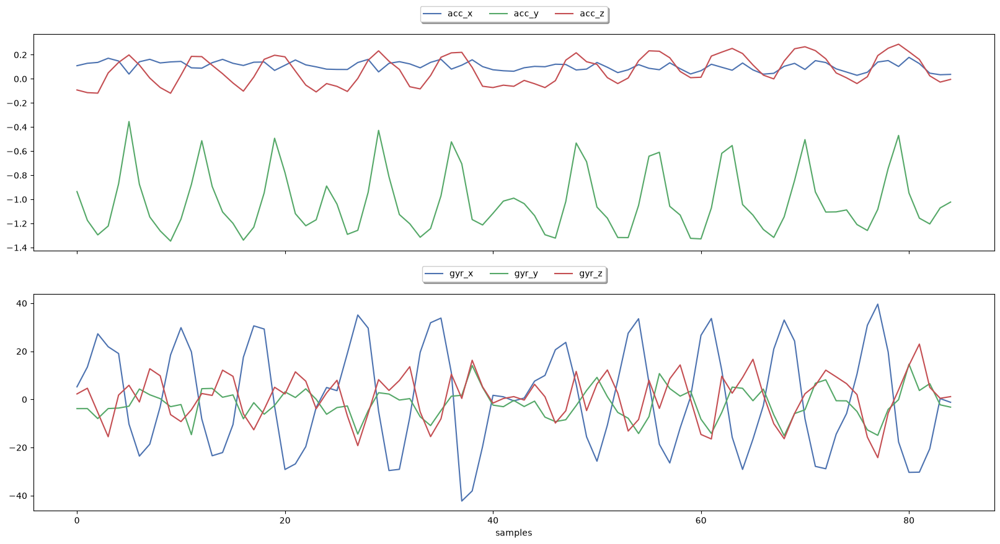

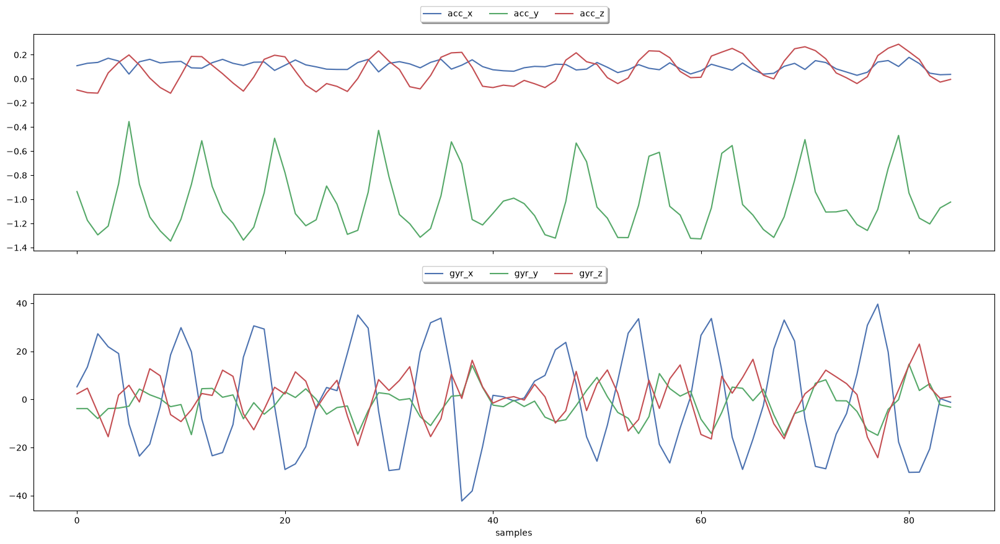

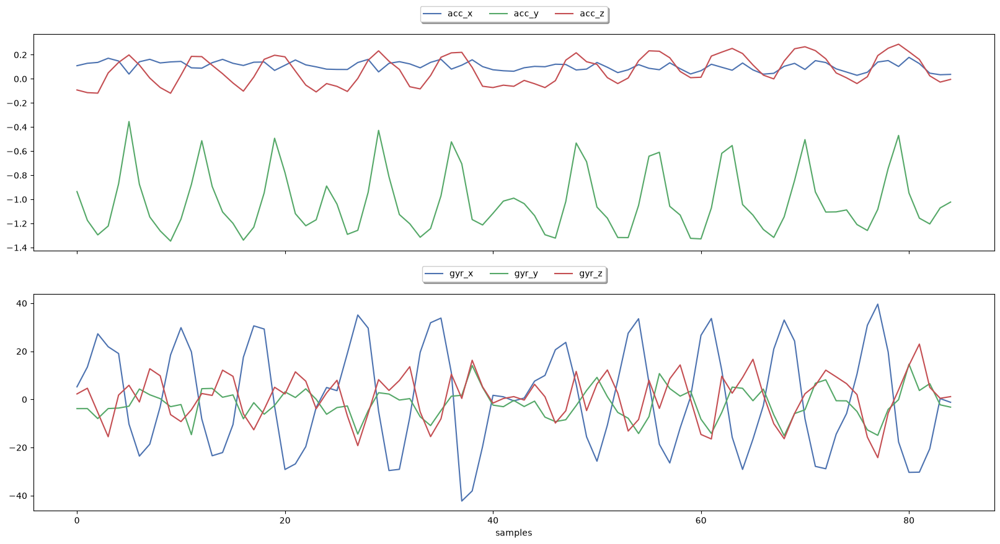

...

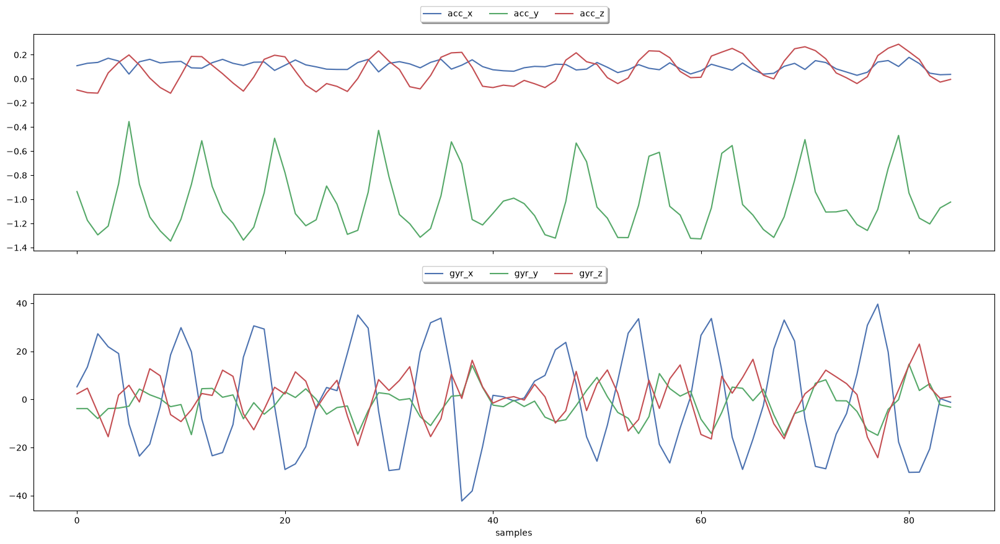

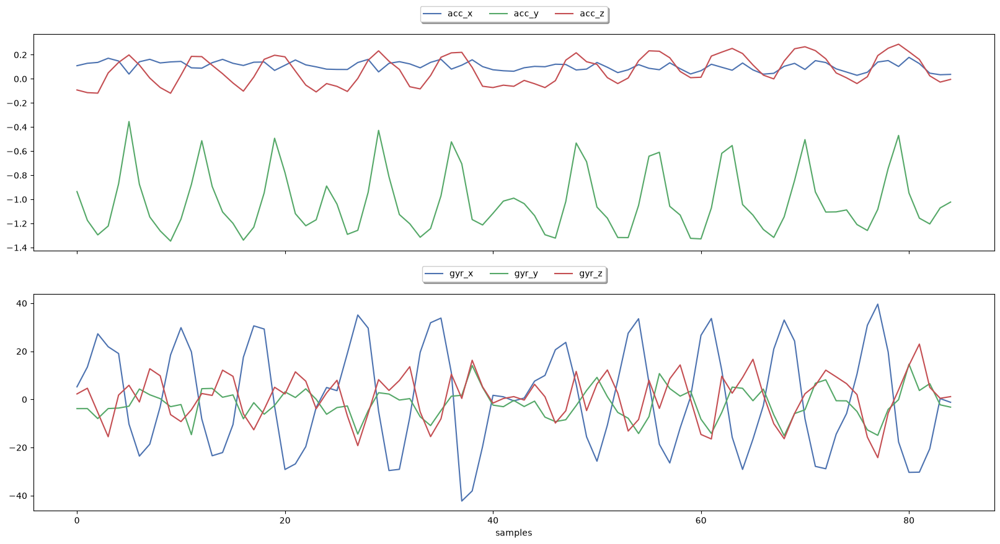

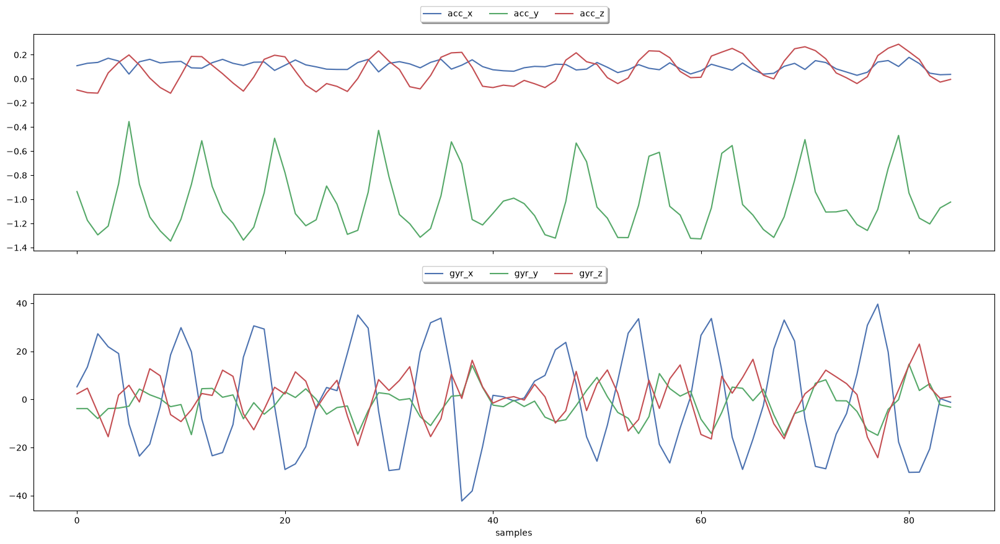

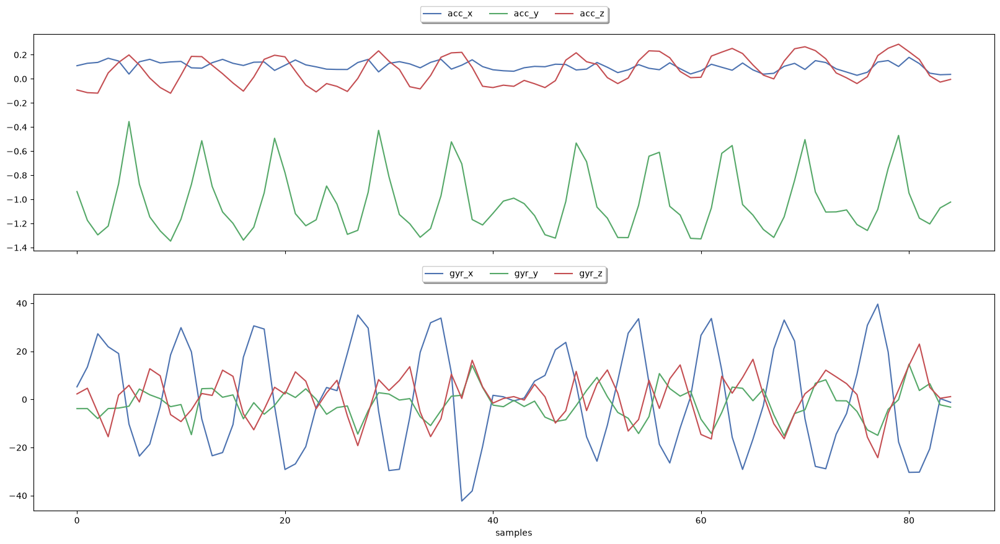

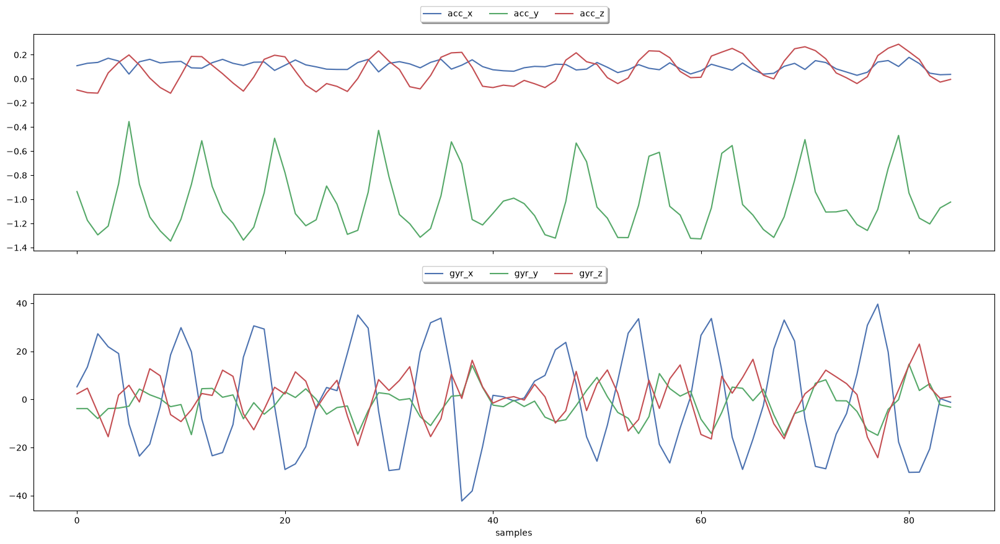

In [32]:
# --------------------------------------------------------------
# Loop over all combinations and export for both sensors
# --------------------------------------------------------------

labels = df["label"].unique()
participants = df["participants"].unique()

# for displaying the acceleration data
for label in labels:
    for participant in participants:
        combined_plot_df = ( df.query(f"label == '{label}'")
                        .query(f"participants == '{participant}'")
                        .reset_index(drop=True))
        
        if len(combined_plot_df) > 0:
            fig, ax = plt.subplots(nrows=2,sharex=True, figsize=(20,10))
            combined_axis_df[["acc_x","acc_y","acc_z"]].plot(ax = ax[0])
            combined_axis_df[["gyr_x","gyr_y","gyr_z"]].plot(ax = ax[1])
            
            #Adding some styling for graph
            ax[0].legend(loc="upper center", bbox_to_anchor =(0.5, 1.15), ncol=3, fancybox=True, shadow=True) #adding ledgend
            ax[1].legend(loc="upper center", bbox_to_anchor =(0.5, 1.15), ncol=3, fancybox=True, shadow=True)
            ax[1].set_xlabel("samples")

            plt.savefig(f"../../reports/figures/{label.title()} ({participant}).png")
            plt.show()
